# Using Geopandas

## Import Statements

We are going to use [geopandas](https://geopandas.org/) to work with some vector data layers.  Geopandas is built on top of pandas, the main addition is its ability to handle **Geometries**.  For this, it relies on another package called [shapely](https://shapely.readthedocs.io/en/stable/manual.html)

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString, Point
%matplotlib notebook

## Creating a Shapely Polygon

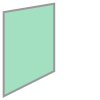

In [2]:
Y = np.array([2,12,13,5])
X = np.array([12,12,18,18])
poly = Polygon(x for x in zip(X, Y))

poly

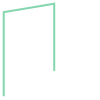

In [3]:
Y = np.array([2,12,13,5])
X = np.array([12,12,18,18])
line = LineString(x for x in zip(X, Y))

line

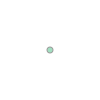

In [4]:
point = Point([2,12])

point

## Read and Inspect a Census Layer

This is the official Canadian Provincial Boundary File from [Stats Canada](https://www12.statcan.gc.ca/census-recensement/2011/geo/bound-limit/bound-limit-2016-eng.cfm).  
We will import it as a [GeoDataframe](https://geopandas.org/docs/user_guide/data_structures.html) using GeoPandas

epsg:3347


<IPython.core.display.Javascript object>


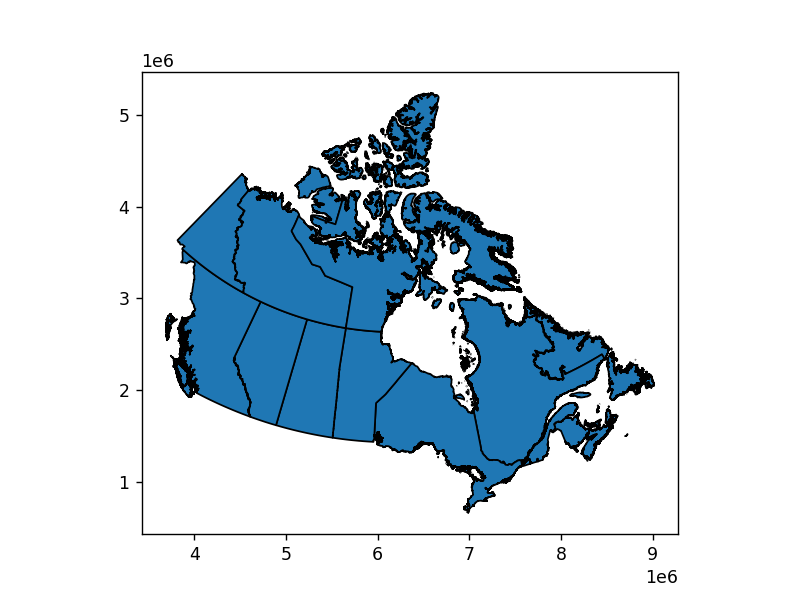

<AxesSubplot:>

In [5]:
Provincial_Boundaries = gpd.read_file('data/CensusData/Provincial_Boundaries.shp').set_index('PRUID')
print(Provincial_Boundaries.crs)
Provincial_Boundaries.plot(edgecolor='black')

In [6]:
Provincial_Boundaries

,PRNAME,geometry
PRUID,,
10,Newfoundland and Labrador,"MULTIPOLYGON (((8307365.589 2582136.711, 83083..."
11,Prince Edward Island,"MULTIPOLYGON (((8435711.754 1679935.966, 84366..."
12,Nova Scotia,"MULTIPOLYGON (((8470851.646 1624745.011, 84717..."
13,New Brunswic,"MULTIPOLYGON (((8176224.537 1722553.460, 81763..."
24,Quebec,"MULTIPOLYGON (((8399709.494 2261445.703, 84005..."
35,Ontario,"MULTIPOLYGON (((6378815.614 2295412.440, 63787..."
46,Manitoba,"MULTIPOLYGON (((6039656.509 2636304.343, 60395..."
47,Saskatchewan,"POLYGON ((5248633.914 2767057.263, 5294993.103..."
48,Alberta,"POLYGON ((5228304.177 2767597.891, 5087063.606..."


## The Geometry Column

Spatial data is stored in the geometry column.  This is what geopandas uses to plot spatial data.


In [7]:
Provincial_Boundaries.geometry[12]

## Joining Tabular Data

The Stats Canada Boundary files don't come with any census data.  We have to obtain that [separately](https://www12.statcan.gc.ca/datasets/Index-eng.cfm?Temporal=2016&Theme=-1&VNAMEE=&GA=-1&S=0) and join it.

In [8]:
# We'll import the tabualr census data with pandas
Census_Tabular = pd.read_csv('Data/CensusData/Provincial_Census.csv',index_col=['PRUID'])
Census_Tabular

,prov,Total Pop
PRUID,,
1,CA,35151728
10,NL,519716
11,PE,142907
12,NS,923598
13,NB,747101
24,QC,8164361
35,ON,13448494
46,MB,1278365
47,SK,1098352


## Joining Tabular and Spatial Data

As long as the spatial layer and the tabular data share the same index key, it is usually quite easy to join the data.

In [9]:
Test = Provincial_Boundaries.join(Census_Tabular)
Test.head()

,PRNAME,geometry,prov,Total Pop
PRUID,,,,
10,Newfoundland and Labrador,"MULTIPOLYGON (((8307365.589 2582136.711, 83083...",NaN,NaN
11,Prince Edward Island,"MULTIPOLYGON (((8435711.754 1679935.966, 84366...",NaN,NaN
12,Nova Scotia,"MULTIPOLYGON (((8470851.646 1624745.011, 84717...",NaN,NaN
13,New Brunswic,"MULTIPOLYGON (((8176224.537 1722553.460, 81763...",NaN,NaN
24,Quebec,"MULTIPOLYGON (((8399709.494 2261445.703, 84005...",NaN,NaN


## But the join fails

Notice the NaN values.

* NaN represents missing data values
    * Lets look at the index for both files?  Maybe we have a data type missmatch?

In [10]:
print(Provincial_Boundaries.index.dtype)
print(Census_Tabular.index.dtype)

object
int64


## What should we change the index data type of the Provincial Boundary Layer too?

In [11]:
dtype = Census_Tabular.index.dtype
Provincial_Boundaries.index = Provincial_Boundaries.index.astype(dtype)
Provincial_Boundaries = Provincial_Boundaries.join(Census_Tabular)
Provincial_Boundaries.head()

,PRNAME,geometry,prov,Total Pop
PRUID,,,,
10,Newfoundland and Labrador,"MULTIPOLYGON (((8307365.589 2582136.711, 83083...",NL,519716
11,Prince Edward Island,"MULTIPOLYGON (((8435711.754 1679935.966, 84366...",PE,142907
12,Nova Scotia,"MULTIPOLYGON (((8470851.646 1624745.011, 84717...",NS,923598
13,New Brunswic,"MULTIPOLYGON (((8176224.537 1722553.460, 81763...",NB,747101
24,Quebec,"MULTIPOLYGON (((8399709.494 2261445.703, 84005...",QC,8164361


<IPython.core.display.Javascript object>


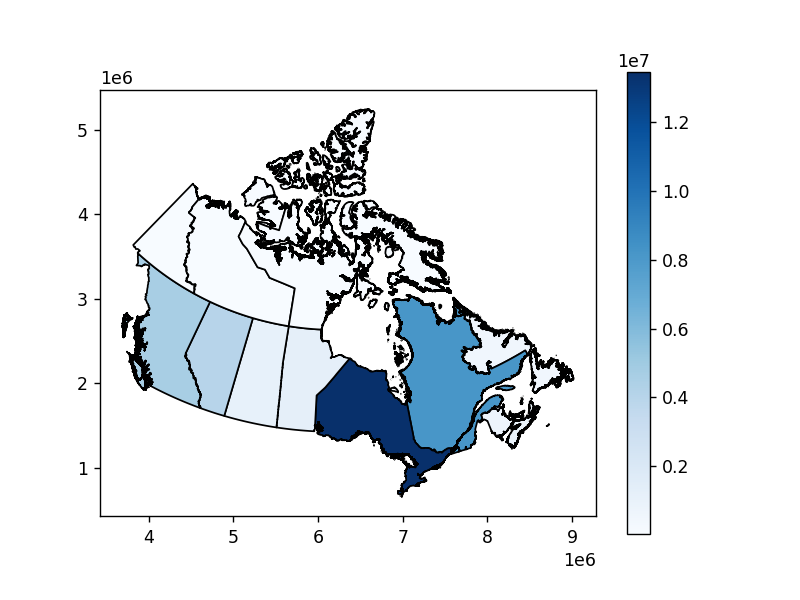

<AxesSubplot:>

In [12]:
Provincial_Boundaries.plot(column='Total Pop',
                     legend = True,
                     cmap='Blues',
                     edgecolor='black')

## More Detailed Census Data

Obtaining data directly from Stats Canada is time consuming and confusing.  A better option (for UBC students) is [simply analytics](https://resources.library.ubc.ca/page.php?id=1044).  This site allows you to explore, map, and download census data for both Canada and the US.  Her, I've downloaded a layer with some demographic variables information for the whole country, by Census Division.  The most recent census was in 2016, but this data was extrapolated to 2020 to estimate more current totals.

In [13]:
Census_Divisions = gpd.read_file('Data/CensusData/SimplyAnalytics_Shapefiles_2021-08-15_23_51_13_58dd63697488338c9616733db9d4817f.shp')
Census_Divisions

,spatial_id,name,VALUE0,VALUE1,VALUE2,VALUE3,geometry
0,1001,"Division No. 1, NL (CD)",8940.0,279512.0,2433.0,11574.0,"POLYGON ((-52.78046 48.17515, -52.77505 48.107..."
1,1002,"Division No. 2, NL (CD)",402.0,19559.0,31.0,133.0,"POLYGON ((-54.09940 48.05997, -54.09743 48.059..."
2,1003,"Division No. 3, NL (CD)",1607.0,14621.0,21.0,79.0,"POLYGON ((-54.88475 48.16867, -54.88152 48.166..."
3,1004,"Division No. 4, NL (CD)",7718.0,20095.0,21.0,138.0,"POLYGON ((-58.18605 48.87718, -58.18641 48.877..."
4,1005,"Division No. 5, NL (CD)",9551.0,42094.0,103.0,468.0,"POLYGON ((-56.43805 50.11598, -56.50000 50.035..."
...,...,...,...,...,...,...,...
288,6105,"Region 5, NT (CD)",4621.0,7170.0,71.0,328.0,"POLYGON ((-110.04698 62.91817, -109.67964 62.8..."
289,6106,"Region 6, NT (CD)",6166.0,22840.0,820.0,3828.0,"POLYGON ((-114.31376 66.05472, -112.58339 65.4..."
290,6204,"Baffin, NU (CD)",16174.0,20872.0,278.0,690.0,"POLYGON ((-60.00000 63.67500, -60.00000 63.668..."
291,6205,"Keewatin, NU (CD)",10373.0,11410.0,42.0,155.0,"POLYGON ((-92.01250 67.00000, -92.00000 67.000..."


## Looking at the Metadata

Data downloaded from SimplyAnalytics comes with the attribute data already joined to the boundary file.  However, it just uses generic column names (VALUE0, VALUE1, etc.).  When you download data from SimplyAnalytics it also comes with a variable_names.txt file that gives us the column header information.

In [14]:
with open('Data/CensusData/variable_names.txt') as f:
    contents = f.readlines()
for line in contents:
    print(line)
    print()

VALUE0	# Household Population by Aboriginal Identity | Household Population For Aboriginal Identity | Aboriginal Identity, 2020


VALUE1	# Basics | Total Population, 2020


VALUE2	# Household Population by Visible Minority Status | Household Population For Visible Minority | Visible Minority Total | Visible Minority Black, 2020


VALUE3	# Household Population by Visible Minority Status | Household Population For Visible Minority | Visible Minority Total, 2020




## Changing Column Names

We can quickly change the column names with the .rename() command

In [15]:
# Shapefile column names have a 10 character limit.
# Geopandas will let us assign any length colum name.
# But when we save the layer any names are cut off after 10 characters.

Census_Divisions=Census_Divisions.rename(columns={
    'VALUE0':'Indigenous',
    'VALUE1':'Total',
    'VALUE2':'Black',
    'VALUE3':'Vis Minor',
})
Census_Divisions

,spatial_id,name,Indigenous,Total,Black,Vis Minor,geometry
0,1001,"Division No. 1, NL (CD)",8940.0,279512.0,2433.0,11574.0,"POLYGON ((-52.78046 48.17515, -52.77505 48.107..."
1,1002,"Division No. 2, NL (CD)",402.0,19559.0,31.0,133.0,"POLYGON ((-54.09940 48.05997, -54.09743 48.059..."
2,1003,"Division No. 3, NL (CD)",1607.0,14621.0,21.0,79.0,"POLYGON ((-54.88475 48.16867, -54.88152 48.166..."
3,1004,"Division No. 4, NL (CD)",7718.0,20095.0,21.0,138.0,"POLYGON ((-58.18605 48.87718, -58.18641 48.877..."
4,1005,"Division No. 5, NL (CD)",9551.0,42094.0,103.0,468.0,"POLYGON ((-56.43805 50.11598, -56.50000 50.035..."
...,...,...,...,...,...,...,...
288,6105,"Region 5, NT (CD)",4621.0,7170.0,71.0,328.0,"POLYGON ((-110.04698 62.91817, -109.67964 62.8..."
289,6106,"Region 6, NT (CD)",6166.0,22840.0,820.0,3828.0,"POLYGON ((-114.31376 66.05472, -112.58339 65.4..."
290,6204,"Baffin, NU (CD)",16174.0,20872.0,278.0,690.0,"POLYGON ((-60.00000 63.67500, -60.00000 63.668..."
291,6205,"Keewatin, NU (CD)",10373.0,11410.0,42.0,155.0,"POLYGON ((-92.01250 67.00000, -92.00000 67.000..."


## Making a Map

We can quickly plot the geodataframe to look at it.

C:\Users\User\.conda\envs\geo-env\lib\site-packages\geopandas\plotting.py:627: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  warnings.warn(


<IPython.core.display.Javascript object>


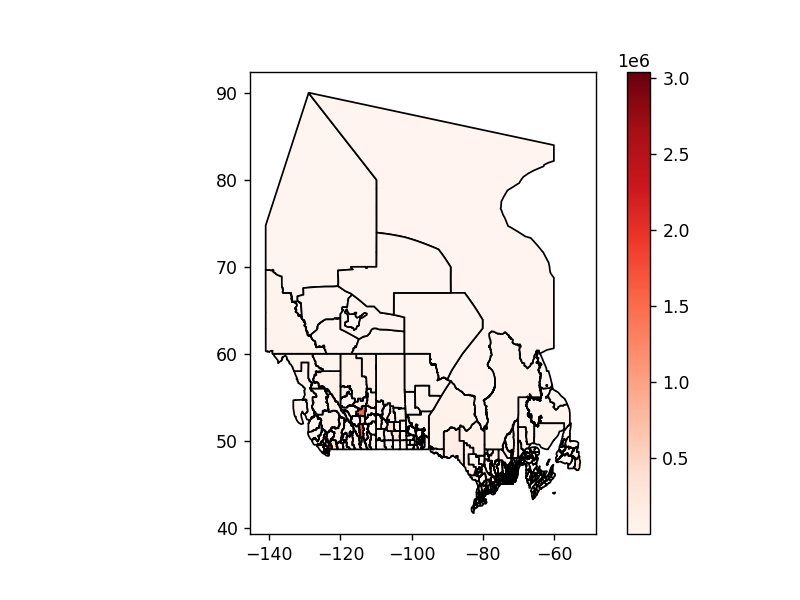

<AxesSubplot:>

In [16]:
Census_Divisions.plot(column='Total',
                             edgecolor='k',
                             colormap='Reds',
                             legend=True)


## Check the CRS

This data looks way different than the provincial boundary layer.  That is because it isn't projected.  Its just in a Geographic Coordinate System (Lat/Lon). 

In [17]:
Census_Divisions.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Projecting Data

[Changing the projection](https://geopandas.org/docs/user_guide/projections.html) is easy with the .to_crs() command.

<IPython.core.display.Javascript object>


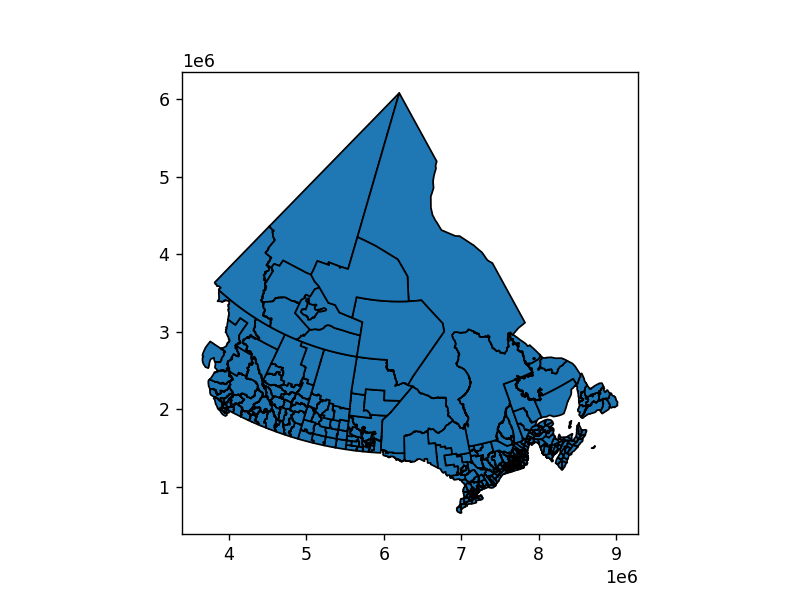

<AxesSubplot:>

In [18]:
Census_Divisions = Census_Divisions.to_crs(Provincial_Boundaries.crs)
Census_Divisions.plot(edgecolor='black')

## Calculations

We can create new information by quickly performing calculations on columns.

<IPython.core.display.Javascript object>


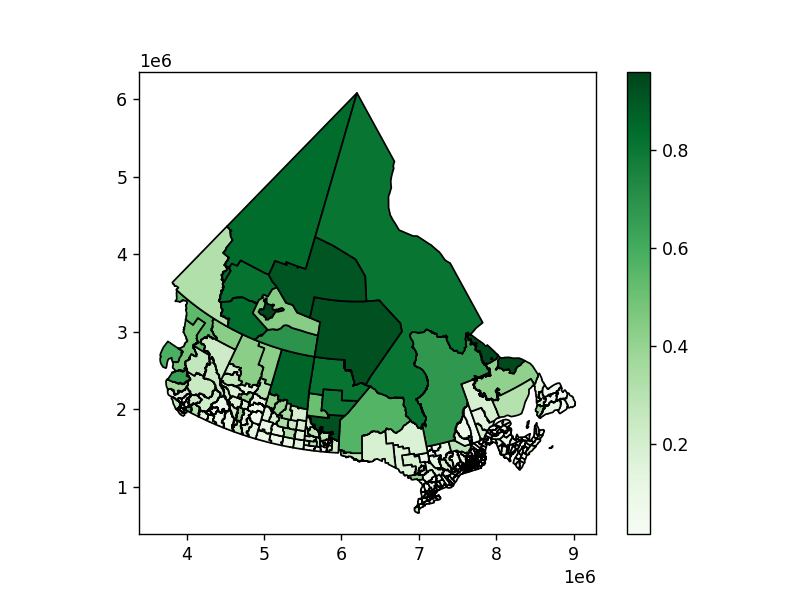

<AxesSubplot:>

In [19]:
Census_Divisions['Indig_pct'] = Census_Divisions['Indigenous']/Census_Divisions['Total']

Census_Divisions['Black_pct'] = Census_Divisions['Black']/Census_Divisions['Total']

Census_Divisions['Nonwht_pct'] = (Census_Divisions['Indigenous']+Census_Divisions['Vis Minor'])/Census_Divisions['Total']

Census_Divisions.plot(column='Nonwht_pct',cmap='Greens',edgecolor='k',legend=True)

# Vector Overlay


Lets import a points layer for some locations in BC and walk through a handful of vector overlay methods.

<IPython.core.display.Javascript object>


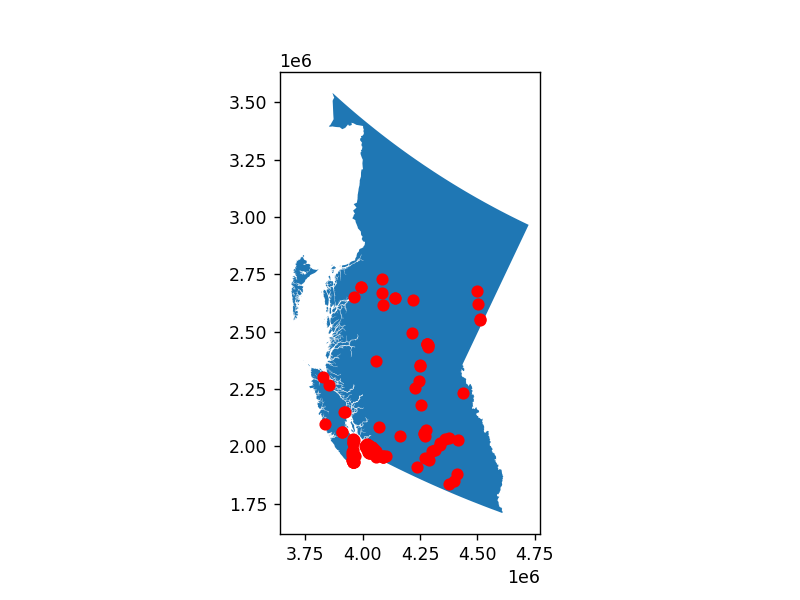

<AxesSubplot:>

In [20]:
Test_Points = gpd.read_file('data/Test_Points.shp')
fig,ax = plt.subplots()
BC = Provincial_Boundaries.loc[Provincial_Boundaries['PRNAME']=='British Columbia']
BC.plot(ax=ax)
Test_Points.plot(ax=ax,color='r')


## Spatial Joins

We can use a [spatial join](https://geopandas.org/gallery/spatial_joins.html) to merge attributes between two layers based on location

In [21]:
# Changin how to "right" will significantly increase the runtime
# and duplicate each province multiple times (once for each incident within it)
Test_Join = gpd.sjoin(Test_Points, BC, how="left") 

Test_Join

,prov_left,city_town,address_in,geometry,index_right,PRNAME,prov_right,Total Pop
0,British Columbia,Enderby,None,POINT (4336484.006 2006697.607),59.0,British Columbia,BC,4648055.0
1,British Columbia,Coquitlam,1100 Heffley Crescent,POINT (4039867.017 1995770.532),59.0,British Columbia,BC,4648055.0
2,British Columbia,Campbell River,2072 S Island Hwy,POINT (3923846.457 2147697.972),59.0,British Columbia,BC,4648055.0
3,British Columbia,Surrey,72 Avenue and 132 Street,POINT (4039411.063 1977638.624),59.0,British Columbia,BC,4648055.0
4,British Columbia,Surrey,6000 block of 134A Street,POINT (4029166.919 1984824.180),59.0,British Columbia,BC,4648055.0
...,...,...,...,...,...,...,...,...
149,British Columbia,Vancouver,900 block of Jervis St.,POINT (4019858.051 2005651.801),59.0,British Columbia,BC,4648055.0
150,British Columbia,Vancouver,600 block of Davie St.,POINT (4018041.610 2007454.076),59.0,British Columbia,BC,4648055.0
151,British Columbia,Vancouver,4800 block of Slocan St.,POINT (4020746.793 2005873.465),59.0,British Columbia,BC,4648055.0
152,British Columbia,Langford (Western Communities),Trans Canada Hwy,POINT (3951549.311 1939531.103),59.0,British Columbia,BC,4648055.0


<IPython.core.display.Javascript object>


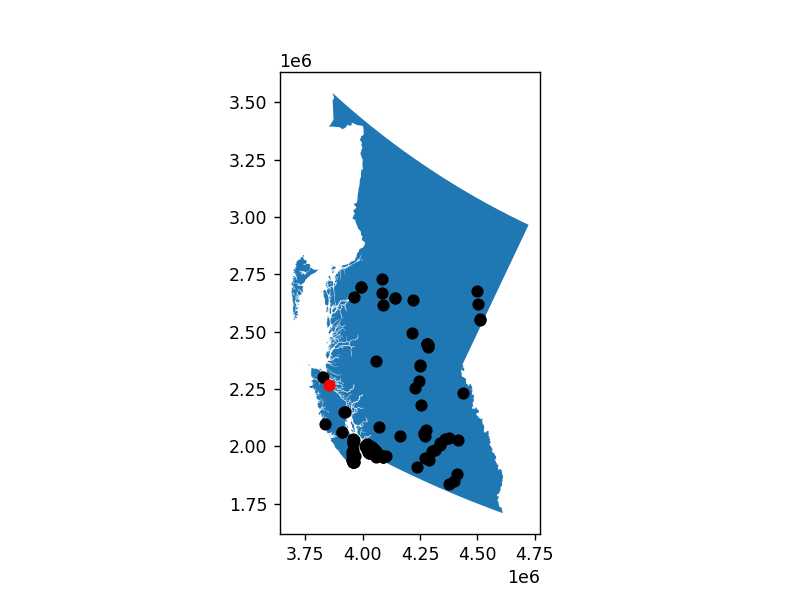

<AxesSubplot:>

In [22]:
fig,ax=plt.subplots()
BC.plot(ax=ax)
## See if there are any locations "outside" the provincial boundaries
Test_Join.loc[Test_Join['PRNAME'].isnull()==False].plot(ax=ax,color='k')
Test_Join.loc[Test_Join['PRNAME'].isnull()].plot(ax=ax,color='r')

## Join the Census Divisions Instead

The census division boundaries don't follow the coastline, so they can include the points that are slightly outside the provincial boundaries.

In [23]:
Test_Join = gpd.sjoin(Test_Points, Census_Divisions, how="left")

print('Not Joined: ',Test_Join.loc[Test_Join['spatial_id'].isnull()].count()['spatial_id'])

Not Joined:  0


## Point In Polygon Analysis

The spatial join method is useful in some cases, but for others, it produces a lot of redundancy.  If your goal is to calculate the number of points per polygon, we can do a point in polygon analysis using the [.within()](https://geopandas.org/docs/reference/api/geopandas.GeoSeries.within.html#geopandas.GeoSeries.within) method. 

In [24]:
Census_Divisions['Count'] = 0.0
for i,row in Census_Divisions.iterrows():
    pip = Test_Points.within(row['geometry'])
    if pip.sum()>0:
#         print(pip.sum())
        Census_Divisions.loc[Census_Divisions.index==i,'Count']+=pip.sum()
print(Census_Divisions['Count'].describe())

count    293.000000
mean       0.525597
std        4.427907
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       73.000000
Name: Count, dtype: float64


<IPython.core.display.Javascript object>


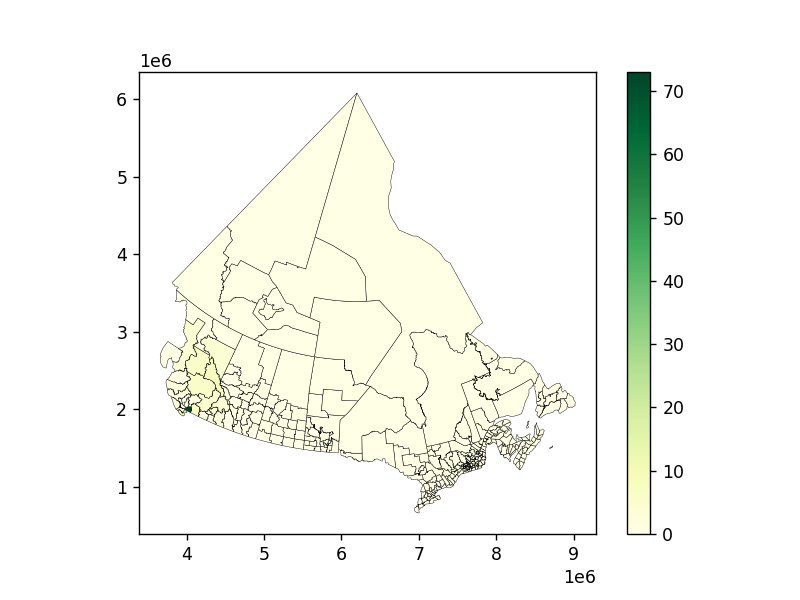

<AxesSubplot:>

In [25]:
Census_Divisions.plot(column='Count',cmap = 'YlGn',legend=True,edgecolor='k',linewidth=.25)

## Clipping a Layer

We can clip the Census Divisions to the the Provincial Boundary Layer so things "look" better.  We can do this with the [.clip()](https://geopandas.org/docs/reference/api/geopandas.clip.html) command.  This command just takes the layer you want to clip as the first input and the layer you want it clipped to as the second input.  Clipping large files takes a bit of time, we can import the [time](https://docs.python.org/3/library/time.html) module to calculate exactly how long this process takes us.

In [ ]:
import time
T1 = time.time()
Census_Divisions_clip = gpd.clip(Census_Divisions,Provincial_Boundaries)
T2 = time.time()
print('Total Runtime: ',T2-T1)
Census_Divisions_clip.plot(edgecolor='black')

## Save the Data

We're going to save the re-projected Census Division Layer with the updated column names and new variables.  We'll save the non-clipped (You will explain why later).

In [ ]:
# Provincial_Boundaries.to_file('Data/CensusData/Provincial_Boundaries_Joined.shp')
Census_Divisions=Census_Divisions.drop('Count',axis=1)
Census_Divisions.to_file('Data/CensusData/Census_Divisons.shp')

In [ ]:

from sklearn.neighbors import KernelDensity

In [35]:
from sklearn.neighbors import KernelDensity

def kde2D(x, y, bandwidth, xbins=100j, ybins=100j, **kwargs): 
    """Build 2D kernel density estimate (KDE)."""

    # create grid of sample locations (default: 100x100)
    xx, yy = np.mgrid[x.min():x.max():xbins, 
                      y.min():y.max():ybins]

    xy_sample = np.vstack([yy.ravel(), xx.ravel()]).T
    xy_train  = np.vstack([y, x]).T

    kde_skl = KernelDensity(bandwidth=bandwidth, **kwargs)
    kde_skl.fit(xy_train)

    # score_samples() returns the log-likelihood of the samples
    z = np.exp(kde_skl.score_samples(xy_sample))
    return xx, yy, np.reshape(z, xx.shape)

<IPython.core.display.Javascript object>


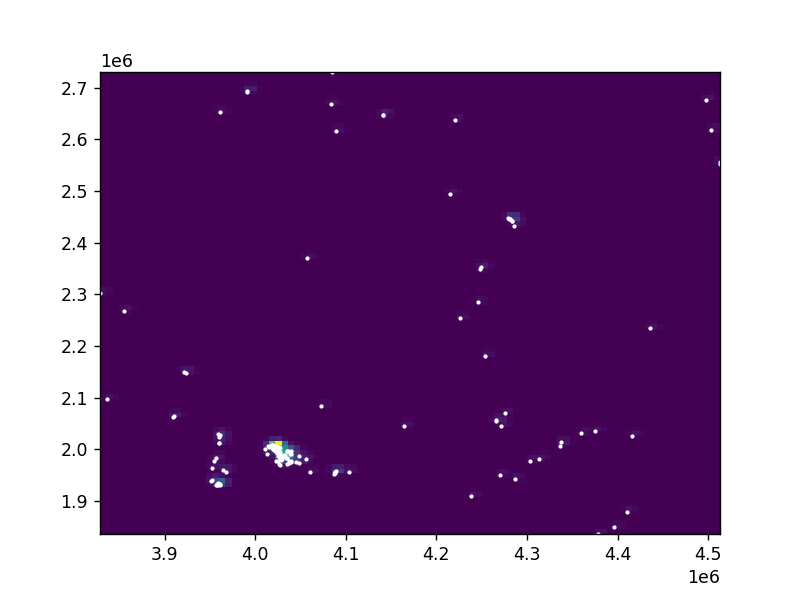

0.0008639570921974116
(100, 100)


C:\Users\User\AppData\Local\Temp/ipykernel_13704/363274592.py:15: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(xx, yy, zz)


In [40]:
# import numpy as np
# import matplotlib.pyplot as plt

# m1 = np.random.normal(size=1000)
# m2 = np.random.normal(scale=0.5, size=1000)


x, y =Test_Join.geometry.x.values,Test_Join.geometry.y.values




xx, yy, zz = kde2D(x, y,5e3)
fig,ax=plt.subplots()
ax.pcolormesh(xx, yy, zz)
ax.scatter(x, y, s=2, facecolor='white')

print(zz.max()*1e6)

print(zz.shape)